In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2

In [2]:
df = pd.read_csv('Car_Images_metadata_fixed.csv')

In [3]:
df.head()

,image_path,label,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.7
1,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.7
2,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,77.7
3,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,77.7
4,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.7


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3533 entries, 0 to 3532
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image_path      3533 non-null   object 
 1   label           3533 non-null   object 
 2   brand           3533 non-null   object 
 3   model           3533 non-null   object 
 4   year            3533 non-null   int64  
 5   filename        3533 non-null   object 
 6   L_real_m        3533 non-null   float64
 7   W_real_m        3533 non-null   float64
 8   H_real_m        3533 non-null   float64
 9   WB_real_m       3533 non-null   float64
 10  Noise_Level_dB  3533 non-null   float64
dtypes: float64(5), int64(1), object(5)
memory usage: 303.7+ KB


In [5]:
df = df.dropna()

In [6]:
df.shape

(3533, 11)

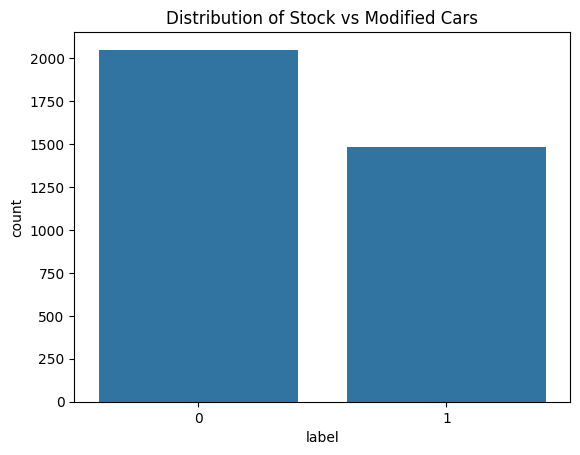

In [17]:
sns.countplot(x='label', data=df)
plt.title('Distribution of Stock vs Modified Cars')
plt.show()

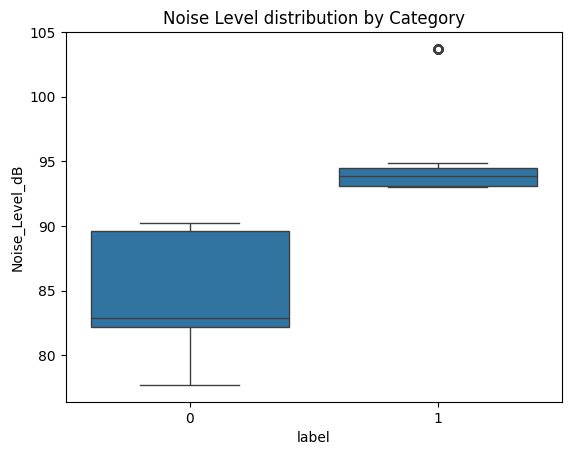

In [18]:
sns.boxplot(x='label', y='Noise_Level_dB', data=df)
plt.title('Noise Level distribution by Category')
plt.show()

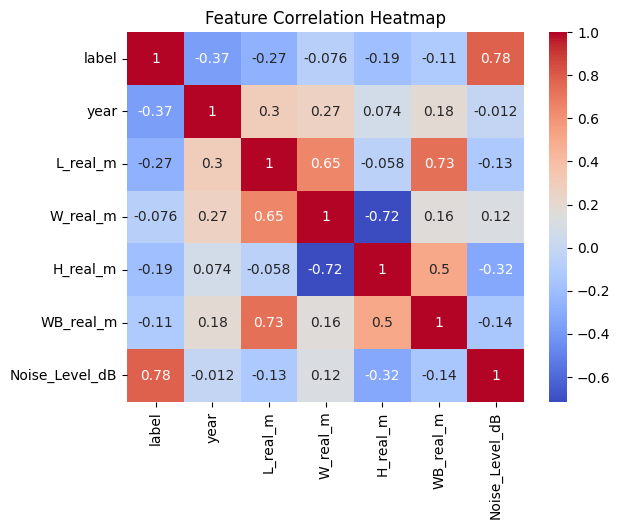

In [19]:
sns.heatmap(df.select_dtypes(include=['number']).corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Heatmap')
plt.show()

In [8]:
df.head()

,image_path,label,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,C:\Users\youss\OneDrive\Desktop\ML for me\trai...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.7
1,C:\Users\youss\OneDrive\Desktop\ML for me\trai...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.7
2,C:\Users\youss\OneDrive\Desktop\ML for me\trai...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,77.7
3,C:\Users\youss\OneDrive\Desktop\ML for me\trai...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,77.7
4,C:\Users\youss\OneDrive\Desktop\ML for me\trai...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.7


In [9]:
X = df.drop("label", axis=1)
Y = df.label

In [10]:
X.head()


,image_path,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,C:\Users\youss\OneDrive\Desktop\ML for me\trai...,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.7
1,C:\Users\youss\OneDrive\Desktop\ML for me\trai...,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.7
2,C:\Users\youss\OneDrive\Desktop\ML for me\trai...,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,77.7
3,C:\Users\youss\OneDrive\Desktop\ML for me\trai...,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,77.7
4,C:\Users\youss\OneDrive\Desktop\ML for me\trai...,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.7


In [11]:
Y.head()

0    0
1    0
2    0
3    0
4    0
Name: label, dtype: int64

In [12]:
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), ['brand', 'model']),
        ('num', StandardScaler(), ['year', 'L_real_m', 'W_real_m', 'H_real_m', 'WB_real_m', 'Noise_Level_dB'])
    ])

In [13]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [14]:
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

In [ ]:
# Optional: Handle imbalance
#smote = SMOTE(random_state=42)
#X_train, Y_train = smote.fit_resample(X_train, Y_train)

In [21]:
images = []
for path in df['image_path']:
    img = cv2.imread(path)
    img = cv2.resize(img, (224, 224))  # Resize
    images.append(img)
images = np.array(images) / 255.0  # Normalize
y = df['label'].values

In [22]:
X_train_img, X_test_img, Y_train, Y_test = train_test_split(images, Y, test_size=0.2, random_state=42)

In [23]:
#Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)
datagen.fit(X_train_img)

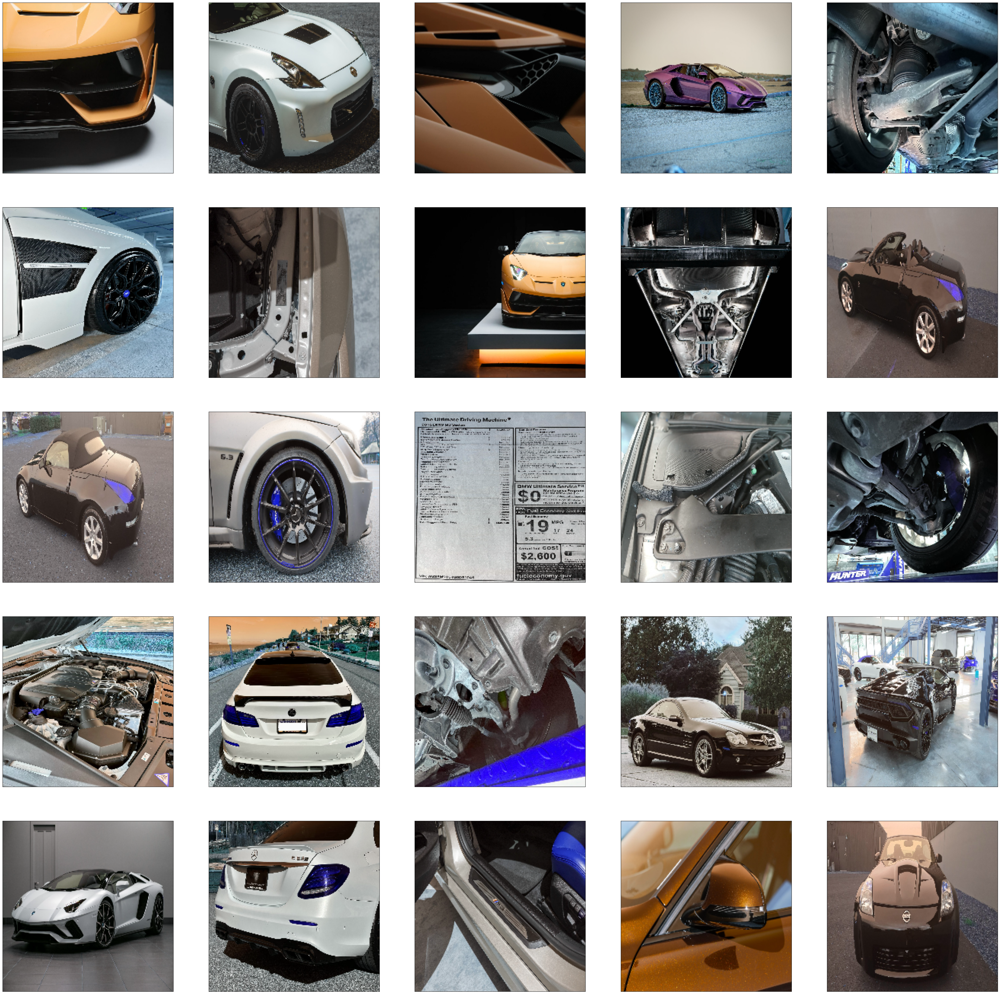

In [25]:
#some examples of the data
plt.figure(figsize=(50, 50))
for i in range(25):    
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_train_img[i], cmap=plt.cm.binary)  
plt.show()